In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.ticker as ticker
import seaborn as sns
sns.set_palette('colorblind')
from matplotlib.pyplot import tight_layout
# ##SETTING PARAMS FOR MATPLOTLIB FIGURES
plt.rcParams.update({"figure.figsize": (6, 6),
                 "axes.facecolor": "white",
                 "axes.edgecolor": "black"})
plt.rcParams['axes.prop_cycle'] = plt.cycler(color=sns.color_palette('colorblind'))
##set font size
font = {'family': 'sans-serif',
       'weight': 'normal',
       'size': 14}
plt.rc('font', **font)
# ##PANDAS PLOTTING
pd.plotting.register_matplotlib_converters()

In [2]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
import statsmodels.formula.api as smf
import plotly.graph_objects as go
import plotly.io as pio
from plotly.subplots import make_subplots
from matplotlib.patches import Patch

# For inline plots in Jupyter
%matplotlib inline
import matplotlib as plt
import glob
import os
import xml.etree.ElementTree as ET
from datetime import datetime, timezone
from tqdm import tqdm
import codecs
import csv
import openpyxl
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.gridspec import GridSpec
from matplotlib.patches import Patch
    

## Step 2 : Import files

In [3]:
data_directory_merged = "/home/paulharford/college/project/project_data/processed/WEATHERED_merged_v2.csv"
full_path_merged = os.path.abspath(data_directory_merged)

In [4]:
df_final_expanded = pd.read_csv(full_path_merged)


In [5]:
df_final_expanded.isnull().sum()

region                      0
date                        0
age_group                   0
gender                      0
hip_fracture_count          0
weather_event               0
warning_phenomenon          0
warning_severity            0
warning_severity_numeric    0
counties_in_region          0
county_weight               0
female                      0
male                        0
total                       0
population                  0
log_population              0
month                       0
season                      0
is_winter                   0
is_spring                   0
is_summer                   0
is_autumn                   0
orange_warning              0
red_warning                 0
yellow_warning              0
orange_warning_lag          0
red_warning_lag             0
cold_weather                0
wind_weather                0
precipitation               0
heat_weather                0
no_adverse_weather          0
cold_lag                    0
wind_lag  

In [6]:
##becuase we can see some over/under dispersion, we will use a quasi-poisson model to scale for that dispearsion

formula = """
hip_fracture_count ~ 
C(weather_event, Treatment(reference=0)) +
C(warning_severity_numeric, Treatment(reference=0)) +
C(gender, Treatment(reference='Female')) +
county_weight + 
C(region, Treatment(reference='HSE South West')):C(weather_event, Treatment(reference=0)) +
C(gender, Treatment(reference='Female')):C(weather_event, Treatment(reference=0))
"""
offset = df_final_expanded["log_population"]
poisson_model = smf.glm(
    formula=formula, 
    data=df_final_expanded, 
    family=sm.families.Poisson(),offset=offset, 
    )
#offset=np.log(df_final['population']
# First fit the regular Poisson model
poisson_results_2 = poisson_model.fit()

# Calculate the dispersion parameter
dispersion = poisson_results_2.deviance / poisson_results_2.df_resid
print(f"Dispersion parameter: {dispersion:.4f}")

# Now fit the quasi-Poisson model by specifying the scale parameter
quasi_poisson_results = poisson_model.fit(scale=dispersion)

# Print the summary of the quasi-Poisson model
print(quasi_poisson_results.summary())
# Optionally, check for overdispersion:
print("Residual Deviance:", quasi_poisson_results.deviance)
print("Degrees of Freedom:", quasi_poisson_results.df_resid)

Dispersion parameter: 0.9118
                 Generalized Linear Model Regression Results                  
Dep. Variable:     hip_fracture_count   No. Observations:                97119
Model:                            GLM   Df Residuals:                    97103
Model Family:                 Poisson   Df Model:                           15
Link Function:                    Log   Scale:                         0.91176
Method:                          IRLS   Log-Likelihood:                -84369.
Date:                Mon, 02 Jun 2025   Deviance:                       88534.
Time:                        15:39:15   Pearson chi2:                 1.35e+05
No. Iterations:                   100   Pseudo R-squ. (CS):            0.04990
Covariance Type:            nonrobust                                         
                                                                                                                                  coef    std err          z      P>|z|      [0.025  

In [7]:
# Extract all unique regions from your dataset
all_regions = df_final_expanded['region'].unique().tolist()

# Print the regions to verify
print("HSE Regions included in analysis:")
for region in all_regions:
    print(f"- {region}")

HSE Regions included in analysis:
- HSE Dublin and Midlands
- HSE Dublin and North East
- HSE Dublin and South East
- HSE Mid West
- HSE South West
- HSE West and North West


In [8]:
def calculate_hip_fracture_rates(model, df, optional_vars=None, reference_population=50000):
    """
    Calculate hip fracture rates using the Poisson model, focusing only on regions and gender.
    
    Parameters:
    -----------
    model : statsmodels GLM results
        Fitted quasi-Poisson model
    df : pandas DataFrame
        Dataset used for modeling
    optional_vars : dict or None, optional 
        Dictionary of optional variables to include (e.g., {'is_winter': 1})
    reference_population : int, optional (default=100000)
        Population size to standardize rates for
    
    Returns:
    --------
    pandas DataFrame
        Table of rates by region, gender, and warning severity
    """
    # Initialize empty list for results
    results = []
    
    # Get unique values
    regions = sorted(df['region'].unique().tolist())
    genders = sorted(df['gender'].unique().tolist())
    
    # Set up the optional variables
    if optional_vars is None:
        optional_vars = {}  # Empty dictionary if no optional variables
    
    # Define scenarios based on the model's structure
    scenarios = [
        {"name": "Baseline", "warning_color": "None", "weather_event": 0, "warning_severity_numeric": 0},
        {"name": "Yellow Warning", "warning_color": "Yellow", "weather_event": 1, "warning_severity_numeric": 1},
        {"name": "Orange Warning", "warning_color": "Orange", "weather_event": 1, "warning_severity_numeric": 2},
        {"name": "Red Warning", "warning_color": "Red", "weather_event": 1, "warning_severity_numeric": 3}
    ]
    
    for region in regions:
        for gender in genders:
            # Get data for this demographic group
            demo_data = df[(df['region'] == region) & (df['gender'] == gender)]
            
            if len(demo_data) == 0:
                continue
            
            # Get the population for this demographic - use the same source as in your model
            if 'population' in demo_data.columns:
                demo_population = demo_data['population'].mean()
            elif 'total' in demo_data.columns:
                demo_population = demo_data['total'].mean()
            else:
                # Try to determine population from gender-specific columns
                gender_col = gender.lower()
                if gender_col in demo_data.columns:
                    demo_population = demo_data[gender_col].mean()
                else:
                    continue  # Skip if we can't determine the population
            
            if pd.isna(demo_population) or demo_population <= 0:
                continue
            
            for scenario in scenarios:
                # Create a new DataFrame with exactly one row
                pred_row = pd.DataFrame({col: [0] for col in df.columns})
                
                # Set key values needed by the model formula
                pred_row['region'] = region
                pred_row['gender'] = gender
                # No longer need age_group
                if 'age_group' in pred_row.columns:
                    # If age_group still exists in the model, use the most common value
                    most_common_age = df['age_group'].mode()[0]
                    pred_row['age_group'] = most_common_age
                
                pred_row['weather_event'] = scenario["weather_event"]
                pred_row['warning_severity_numeric'] = scenario["warning_severity_numeric"]
                
                # Add any optional variables
                for var_name, var_value in optional_vars.items():
                    if var_name in pred_row.columns:
                        pred_row[var_name] = var_value
                
                # Set the population and log_population variables
                pred_row['population'] = demo_population
                pred_row['log_population'] = np.log(demo_population)
                
                try:
                    # Get predicted value (this is already a rate per person because of the offset)
                    predicted_rate = model.predict(pred_row).iloc[0]
                    
                    # Scale to reference population (e.g., per 100,000)
                    # Since predicted_rate is already per person, we just multiply by reference population
                    standardized_rate = predicted_rate * reference_population
                    
                    # Store result - removed Age Group
                    results.append({
                        'Region': region,
                        'Gender': gender,
                        'Warning Color': scenario["warning_color"],
                        'Scenario': scenario["name"],
                        f'Rate per {reference_population:,}': standardized_rate
                    })
                except Exception as e:
                    print(f"Error predicting for {region}, {gender}, scenario={scenario['name']}: {str(e)}")
                    # Additional diagnostic output
                    if hasattr(model, 'model') and hasattr(model.model, 'exog_names'):
                        print(f"Model formula terms: {model.model.exog_names}")
                    print(f"Prediction data columns: {pred_row.columns.tolist()}")
    
    # Convert to DataFrame
    results_df = pd.DataFrame(results)
    
    # Sort by key dimensions
    if not results_df.empty:
        results_df = results_df.sort_values(['Region', 'Gender', 'Warning Color'])
    
    return results_df

def plot_rates_by_region(rates_df, reference_population=50000, save_path=None):
    """
    Create bar plots showing hip fracture rates by gender and warning severity for each region,
    including percentage changes from baseline.
    
    Parameters:
    -----------
    rates_df : pandas DataFrame
        Output from calculate_hip_fracture_rates function
    reference_population : int, optional (default=100000)
        Population size used for standardization
    save_path : str or None, optional (default=None)
        If provided, saves the plot to this file path
    
    Returns:
    --------
    None (displays plots)
    """
    import matplotlib.pyplot as plt
    import numpy as np
    import seaborn as sns
    
    # Check if we have any data to plot
    if rates_df.empty:
        print("No data available to plot.")
        return
    
    # Define colors for warning levels
    warning_colors = {
        'None': 'gray',
        'Yellow': 'gold',
        'Orange': 'darkorange',
        'Red': 'darkred'
    }
    
    # Get unique regions
    regions = rates_df['Region'].unique()
    
    # For each region, create a separate figure
    for region in regions:
        region_data = rates_df[rates_df['Region'] == region]
        
        # Get unique genders for this region
        genders = sorted(region_data['Gender'].unique())
        
        # Check if we have any genders to plot
        if len(genders) == 0:
            print(f"No data available for region {region}")
            continue
        
        # Set up the plot - one plot per region now that we've removed age groups
        fig = plt.figure(figsize=(12, 8))
        plt.title(f'Hip Fracture Rates in {region} per {reference_population:,} Population', 
                  fontsize=16, fontweight='bold')
        
        # Set up positions for grouped bars
        gender_positions = {gender: i for i, gender in enumerate(genders)}
        bar_width = 0.2
        
        # Track legend handles and labels
        handles = []
        labels = []
        
        # Set up section for percentage comparison summary
        summary_text = f"Weather Impact Differences by Gender in {region}:\n"
        
        # Plot bars for each warning color
        for warning_color, color in warning_colors.items():
            warning_data = region_data[region_data['Warning Color'] == warning_color]
            
            for gender, pos in gender_positions.items():
                gender_warning_data = warning_data[warning_data['Gender'] == gender]
                if not gender_warning_data.empty:
                    rate_col = f'Rate per {reference_population:,}'
                    rate = gender_warning_data[rate_col].values[0]
                    
                    # Calculate position for this bar
                    x_pos = pos + (list(warning_colors.keys()).index(warning_color) * bar_width)
                    
                    # Create bar
                    bar = plt.bar(x_pos, rate, width=bar_width, color=color, 
                              label=f'{warning_color} Warning')
                    
                    # Add to legend handles only once per warning color
                    if gender == genders[0]:
                        handles.append(bar[0])
                        labels.append(f'{warning_color} Warning')
                    
                    # Add text with rate value
                    plt.text(x_pos, rate, f'{rate:.1f}', 
                             ha='center', va='bottom', fontsize=9)
                    
                    # Add percentage change for non-baseline scenarios
                    if warning_color != 'None':
                        # Find the baseline rate for this gender
                        baseline_data = region_data[(region_data['Gender'] == gender) & 
                                                  (region_data['Warning Color'] == 'None')]
                        
                        if not baseline_data.empty:
                            baseline_rate = baseline_data[rate_col].values[0]
                            
                            if baseline_rate > 0:
                                # Calculate percentage change from baseline for this specific gender
                                pct_change = ((rate - baseline_rate) / baseline_rate) * 100
                                
                                # Position the percentage change text below the rate value
                                plt.text(x_pos, rate * 0.5, f'({pct_change:+.1f}%)', 
                                         ha='center', va='center', fontsize=15, 
                                         color='white' if pct_change < 0 else 'black',
                                         fontweight='bold')
                                
                                # Add to summary text - but only do this once per warning color
                                if warning_color not in ['None'] and gender == 'Male':
                                    # Get the corresponding female percentage for comparison
                                    female_data = region_data[(region_data['Gender'] == 'Female') & 
                                                           (region_data['Warning Color'] == warning_color)]
                                    female_baseline = region_data[(region_data['Gender'] == 'Female') & 
                                                               (region_data['Warning Color'] == 'None')][rate_col].values[0]
                                    
                                    if not female_data.empty and female_baseline > 0:
                                        female_rate = female_data[rate_col].values[0]
                                        female_pct = ((female_rate - female_baseline) / female_baseline) * 100
                                        diff = pct_change - female_pct
                                        
                                        summary_text += f"• {warning_color} Warning: Male {pct_change:+.1f}%, Female {female_pct:+.1f}%, "
                                        summary_text += f"Difference: {diff:+.1f} percentage points\n"
        
        # Set plot details
        plt.xticks([p + (len(warning_colors) * bar_width) / 2 - bar_width/2 for p in range(len(gender_positions))], 
                   gender_positions.keys())
        plt.xlabel('Gender', fontsize=12)
        plt.ylabel(f'Rate per {reference_population:,}', fontsize=12)
        plt.grid(axis='y', linestyle='--', alpha=0.7)
        
        # Add legend
        plt.legend(handles, labels, loc='upper right')
        
        # Add gender difference summary text to the bottom of the plot
        if len(genders) > 1:  # Only add if we have multiple genders
            plt.figtext(0.5, 0.01, summary_text, ha='center', fontsize=10, 
                       bbox=dict(facecolor='lightyellow', alpha=0.5))
        
        plt.tight_layout(rect=[0, 0.12, 1, 1] if len(genders) > 1 else None)  # Adjust for summary text
        
        # Save the plot if a path is provided
        if save_path:
            # Create a region-specific filename if a directory is provided
            if save_path.endswith('/') or save_path.endswith('\\'):
                file_path = f"{save_path}hip_fracture_rates_{region.replace(' ', '_')}.png"
            else:
                file_path = save_path
            plt.savefig(file_path, dpi=300, bbox_inches='tight')
            print(f"Plot saved to: {file_path}")
        
        plt.show()
        
def plot_comparative_rates(rates_df, reference_population=50000):
    """
    Create a single plot comparing hip fracture rates across all regions by gender.
    
    Parameters:
    -----------
    rates_df : pandas DataFrame
        Output from calculate_hip_fracture_rates function
    reference_population : int, optional (default=100000)
        Population size used for standardization
    
    Returns:
    --------
    None (displays plot)
    """
    import matplotlib.pyplot as plt
    import numpy as np
    import seaborn as sns
    
    # Check if we have any data to plot
    if rates_df.empty:
        print("No data available to plot.")
        return
    
    # Define warning colors
    warning_colors = {
        'None': 'gray',
        'Yellow': 'gold',
        'Orange': 'darkorange',
        'Red': 'darkred'
    }
    
    # Let's create a single comprehensive plot that compares rates across regions by gender
    plt.figure(figsize=(15, 10))
    
    # For each warning severity, create a separate subplot
    warning_levels = sorted(rates_df['Warning Color'].unique().tolist())
    
    for i, warning in enumerate(warning_levels):
        plt.subplot(2, 2, i+1)  # Assumes 4 warning levels
        
        warning_data = rates_df[rates_df['Warning Color'] == warning]
        
        # Pivot the data to get regions as columns and genders as rows
        pivot_data = warning_data.pivot_table(
            index='Gender', 
            columns='Region',
            values=f'Rate per {reference_population:,}'
        )
        
        # Plot as bar chart
        ax = pivot_data.plot(kind='bar', ax=plt.gca(), color=sns.color_palette("husl", len(pivot_data.columns)))
        
        plt.title(f'{warning} Warning Hip Fracture Rate', fontsize=14)
        plt.ylabel(f'Rate per {reference_population:,}', fontsize=12)
        plt.xlabel('Gender', fontsize=12)
        plt.grid(axis='y', linestyle='--', alpha=0.7)
        plt.legend(title='Region')
    
    plt.suptitle(f'Comparison of Hip Fracture Rates by Region and Gender per {reference_population:,} Population', 
                fontsize=16, fontweight='bold')
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    
    plt.show()



In [9]:
# present to Noca - 
#
#


Plot saved to: /home/paulharford/college/project/ul_project_Msc_AI/analysis/processed_data/visual_outputs/ihfd_weather/hip_fracture_rates_HSE_Dublin_and_Midlands.png


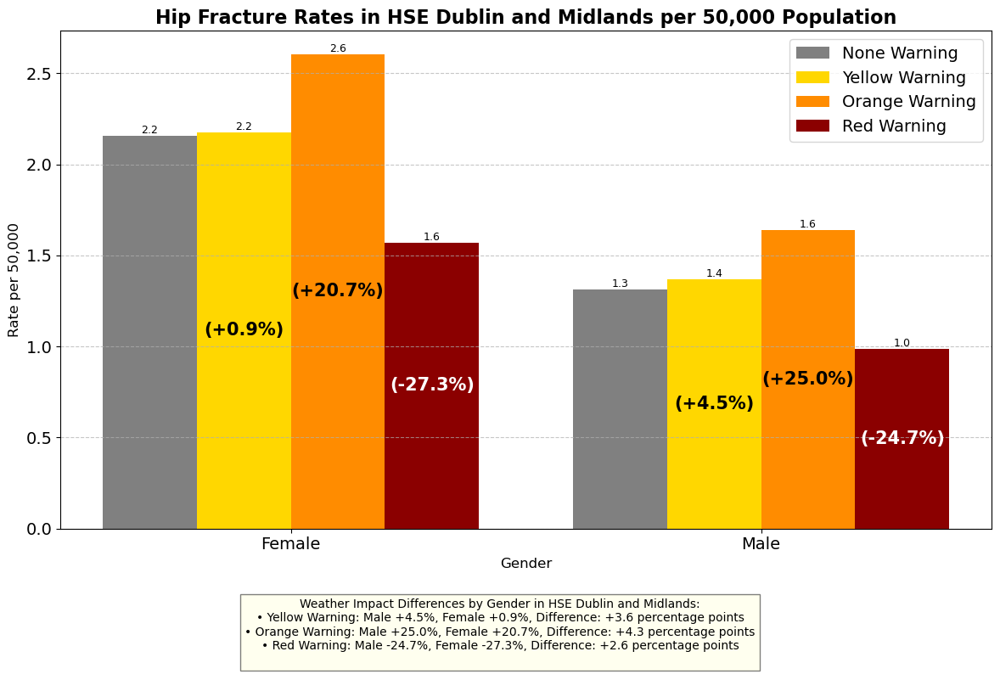

Plot saved to: /home/paulharford/college/project/ul_project_Msc_AI/analysis/processed_data/visual_outputs/ihfd_weather/hip_fracture_rates_HSE_Dublin_and_North_East.png


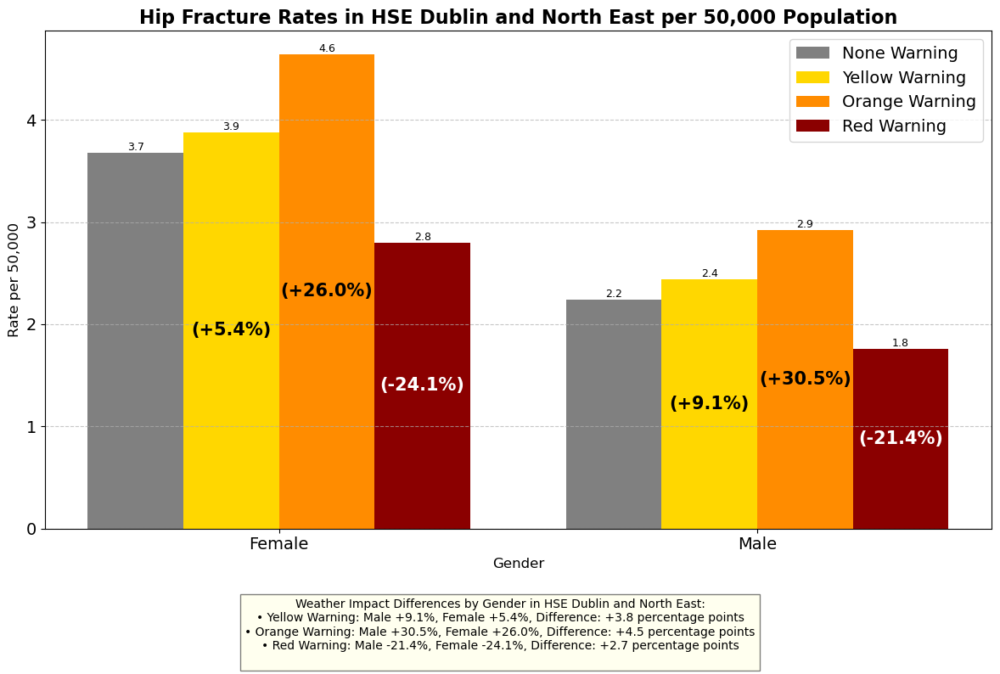

Plot saved to: /home/paulharford/college/project/ul_project_Msc_AI/analysis/processed_data/visual_outputs/ihfd_weather/hip_fracture_rates_HSE_Dublin_and_South_East.png


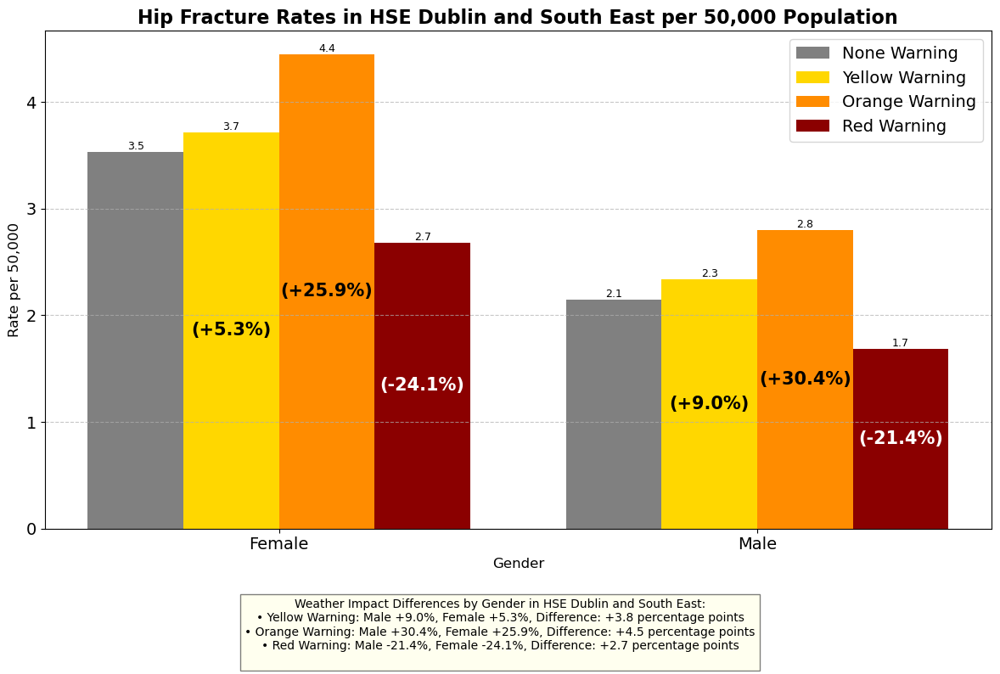

Plot saved to: /home/paulharford/college/project/ul_project_Msc_AI/analysis/processed_data/visual_outputs/ihfd_weather/hip_fracture_rates_HSE_Mid_West.png


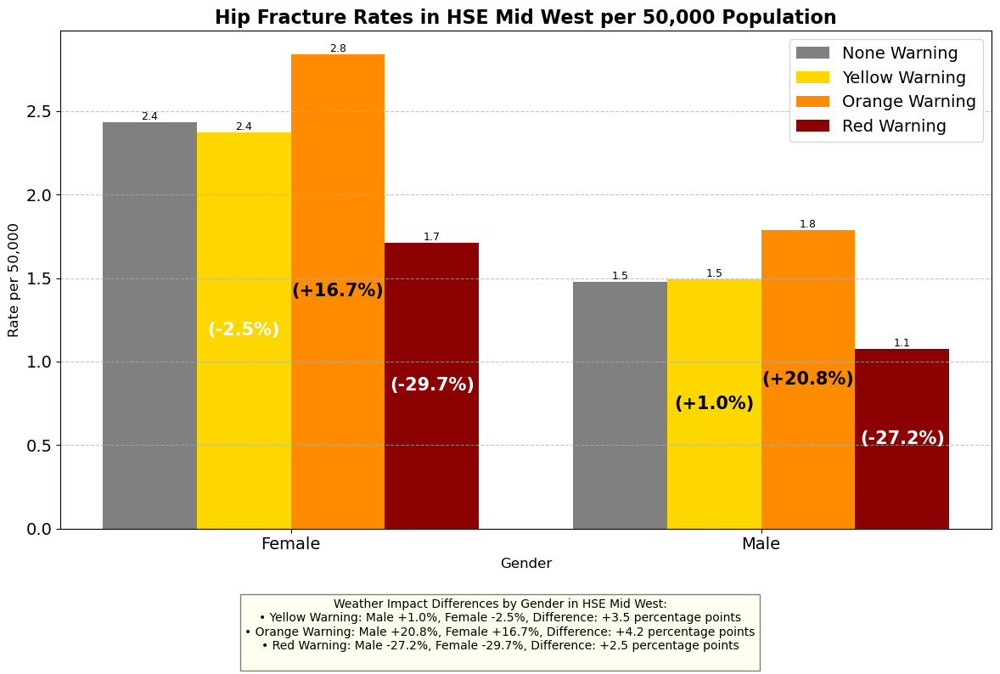

Plot saved to: /home/paulharford/college/project/ul_project_Msc_AI/analysis/processed_data/visual_outputs/ihfd_weather/hip_fracture_rates_HSE_South_West.png


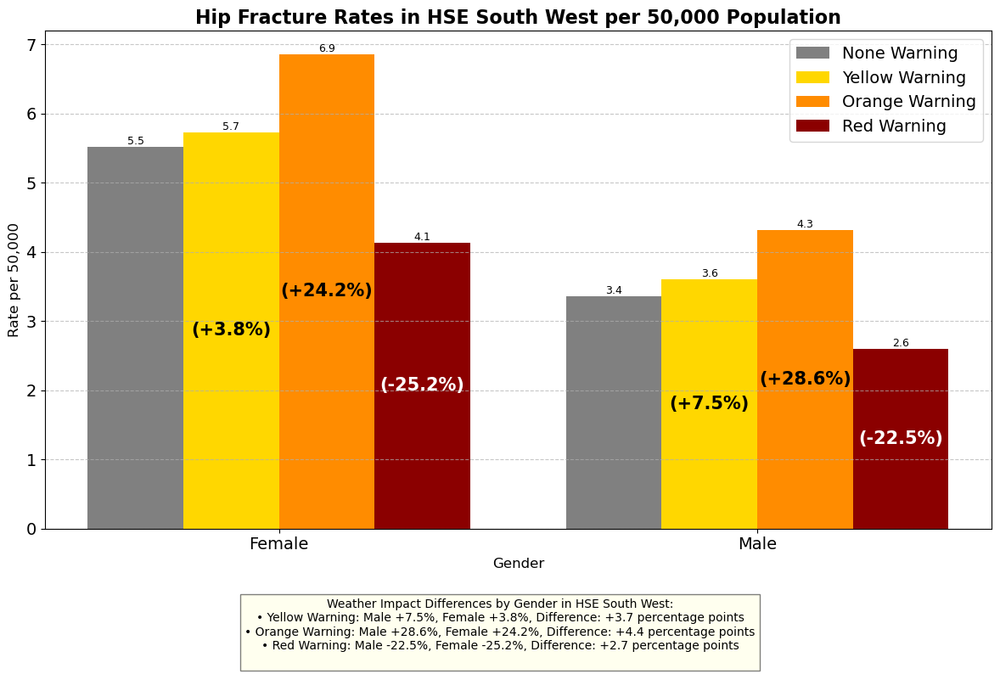

Plot saved to: /home/paulharford/college/project/ul_project_Msc_AI/analysis/processed_data/visual_outputs/ihfd_weather/hip_fracture_rates_HSE_West_and_North_West.png


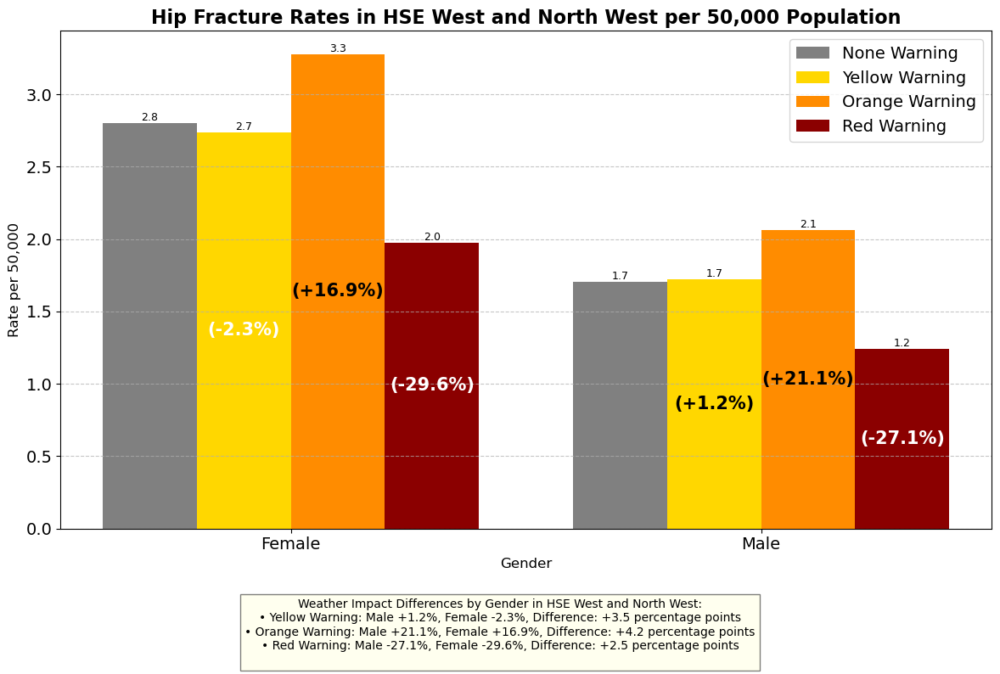

In [10]:
# Example usage:
rates = calculate_hip_fracture_rates(poisson_results_2, df_final_expanded, reference_population=50000)
plot_rates_by_region(rates, save_path='/home/paulharford/college/project/ul_project_Msc_AI/analysis/processed_data/visual_outputs/ihfd_weather/')

reference_population=50000


In [11]:
def calculate_percentage_changes(rates_df, reference_population=50000):
    """
    Calculate percentage changes from baseline for all combinations in the rates DataFrame.
    
    Parameters:
    -----------
    rates_df : pandas DataFrame
        Output from calculate_hip_fracture_rates function
    reference_population : int, optional (default=100000)
        Population size used for standardization
    
    Returns:
    --------
    dict
        Dictionary with (region, gender, warning) keys and percentage change values
    """
    pct_changes = {}
    rate_col = f'Rate per {reference_population:,}'
    
    # First, store all baseline rates
    baselines = {}
    for _, row in rates_df[rates_df['Warning Color'] == 'None'].iterrows():
        region = row['Region']
        gender = row['Gender']
        baselines[(region, gender)] = row[rate_col]
    
    # Then calculate percentage changes for all non-baseline scenarios
    for _, row in rates_df[rates_df['Warning Color'] != 'None'].iterrows():
        region = row['Region']
        gender = row['Gender']
        warning = row['Warning Color']
        current_rate = row[rate_col]
        
        # Get the corresponding baseline rate
        baseline_key = (region, gender)
        if baseline_key in baselines and baselines[baseline_key] > 0:
            baseline_rate = baselines[baseline_key]
            pct_change = ((current_rate - baseline_rate) / baseline_rate) * 100
            pct_changes[(region, gender, warning)] = pct_change
    
    return pct_changes

def plot_nationwide_rates(rates_df, pct_changes, reference_population=50000, save_path=None):
    """
    Create a consolidated plot showing hip fracture rates across all of Ireland,
    summarizing the data from all regions with clear separation between gender groups.
    
    Parameters:
    -----------
    rates_df : pandas DataFrame
        Output from calculate_hip_fracture_rates function
    pct_changes : dict
        Dictionary with (region, gender, warning) keys and percentage change values
    reference_population : int, optional (default=100000)
        Population size used for standardization
    save_path : str or None, optional (default=None)
        If provided, saves the plot to this file path
    
    Returns:
    --------
    None (displays plot)
    """
    import matplotlib.pyplot as plt
    import numpy as np
    import pandas as pd
    import seaborn as sns
    
    # Check if we have any data to plot
    if rates_df.empty:
        print("No data available to plot.")
        return
    
    # Define colors for warning levels
    warning_colors = {
        'None': 'gray',
        'Yellow': 'gold',
        'Orange': 'darkorange',
        'Red': 'darkred'
    }
    
    # Create the figure
    fig, ax = plt.subplots(figsize=(14, 8))
    plt.title('Hip Fracture Rates Across Ireland by Gender and Weather Warning Level', 
              fontsize=18, fontweight='bold')
    
    # Extract unique genders and warning levels
    genders = sorted(rates_df['Gender'].unique())
    warning_levels = sorted(rates_df['Warning Color'].unique())
    
    # Calculate average rates for each gender and warning level combination
    summary_data = []
    for gender in genders:
        for warning in warning_levels:
            subset = rates_df[(rates_df['Gender'] == gender) & 
                             (rates_df['Warning Color'] == warning)]
            
            if not subset.empty:
                rate_col = f'Rate per {reference_population:,}'
                avg_rate = subset[rate_col].mean()
                
                # Calculate average percentage change if not baseline
                avg_pct_change = 0
                if warning != 'None':
                    pct_values = [pct_changes.get((region, gender, warning), 0) 
                                 for region in rates_df['Region'].unique()]
                    pct_values = [p for p in pct_values if p != 0]  # Filter out missing values
                    avg_pct_change = sum(pct_values) / len(pct_values) if pct_values else 0
                
                summary_data.append({
                    'Gender': gender,
                    'Warning Color': warning,
                    'Average Rate': avg_rate,
                    'Average Pct Change': avg_pct_change
                })
    
    # Convert to DataFrame for easier plotting
    summary_df = pd.DataFrame(summary_data)
    
    # BAR CHART FOR RATES
    # We'll add a gap between gender groups
    width = 0.18  # Narrower bars to accommodate the gap
    group_gap = 0.8  # Gap between gender groups
    
    # Create positions for gender groups with a gap between them
    if len(genders) == 2:  # Assuming 'Male' and 'Female'
        # Position groups on either side of the center with a gap
        x = np.array([-group_gap/2, group_gap/2])
    else:
        # If more than 2 genders, space them evenly
        x = np.arange(len(genders)) * (1 + group_gap/len(genders))
    
    # Create a mapping from gender to position
    gender_positions = {gender: pos for gender, pos in zip(genders, x)}
    
    # Plot bars for each warning level within each gender group
    for i, warning in enumerate(warning_levels):
        warning_data = summary_df[summary_df['Warning Color'] == warning]
        
        if not warning_data.empty:
            for gender in genders:
                gender_warning_data = warning_data[warning_data['Gender'] == gender]
                
                if not gender_warning_data.empty:
                    # Get the position for this gender
                    pos = gender_positions[gender]
                    
                    # Calculate the offset for this warning level
                    offset = (i - len(warning_levels)/2 + 0.5) * width
                    
                    # Get the rate for this combination
                    rate = gender_warning_data['Average Rate'].values[0]
                    
                    # Create the bar
                    bar = ax.bar(pos + offset, rate, width, 
                                 label=f'{warning} Warning' if gender == genders[0] else "",
                                 color=warning_colors[warning])
                    
                    # Add rate label on top
                    ax.text(pos + offset, rate, f'{rate:.1f}', 
                            ha='center', va='bottom', fontsize=9)
                    
                    # Add percentage change for non-baseline warning levels
                    if warning != 'None':
                        pct_change = gender_warning_data['Average Pct Change'].values[0]
                        ax.text(pos + offset, rate*0.5, f'({pct_change:+.1f}%)', 
                                ha='center', va='center', fontsize=10, fontweight='bold',
                                color='white' if pct_change < 0 else 'black')
    
    # Set up the x-axis with gender labels
    ax.set_xticks(list(gender_positions.values()))
    ax.set_xticklabels(list(gender_positions.keys()), fontsize=12)
    
    # Add vertical lines to separate gender groups more clearly
    if len(genders) > 1:
        gender_positions_list = list(gender_positions.values())
        for i in range(len(gender_positions_list) - 1):
            mid_point = (gender_positions_list[i] + gender_positions_list[i+1]) / 2
            ax.axvline(x=mid_point, color='lightgray', linestyle='--', alpha=0.5)
    
    # Add y-axis label and grid
    ax.set_ylabel(f'Rate per {reference_population:,}', fontsize=14)
    ax.grid(axis='y', linestyle='--', alpha=0.7)
    
    # Add legend
    ax.legend(title='Warning Level', loc='upper right')
    
    # Add gender difference summary at the bottom
    summary_text = "Gender Differences in Weather Response Across Ireland:\n"
    for warning in [w for w in warning_levels if w != 'None']:
        if len(genders) > 1:
            male_data = summary_df[(summary_df['Gender'] == 'Male') & (summary_df['Warning Color'] == warning)]
            female_data = summary_df[(summary_df['Gender'] == 'Female') & (summary_df['Warning Color'] == warning)]
            
            if not male_data.empty and not female_data.empty:
                male_pct = male_data['Average Pct Change'].values[0]
                female_pct = female_data['Average Pct Change'].values[0]
                diff = male_pct - female_pct
                
                summary_text += f"• {warning} Warning: Male {male_pct:+.1f}%, Female {female_pct:+.1f}%, "
                summary_text += f"Difference: {diff:+.1f} percentage points\n"
    
    plt.figtext(0.5, 0.01, summary_text, ha='center', fontsize=12, 
               bbox=dict(facecolor='lightyellow', alpha=0.5))
    
    plt.tight_layout(rect=[0, 0.15, 1, 0.98])
    
    # Save the plot if a path is provided
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Nationwide summary plot saved to: {save_path}")
    
    plt.show()
    

Nationwide summary plot saved to: /home/paulharford/college/project/ul_project_Msc_AI/analysis/processed_data/visual_outputs/ihfd_weather/ireland_hip_fracture_summary.png


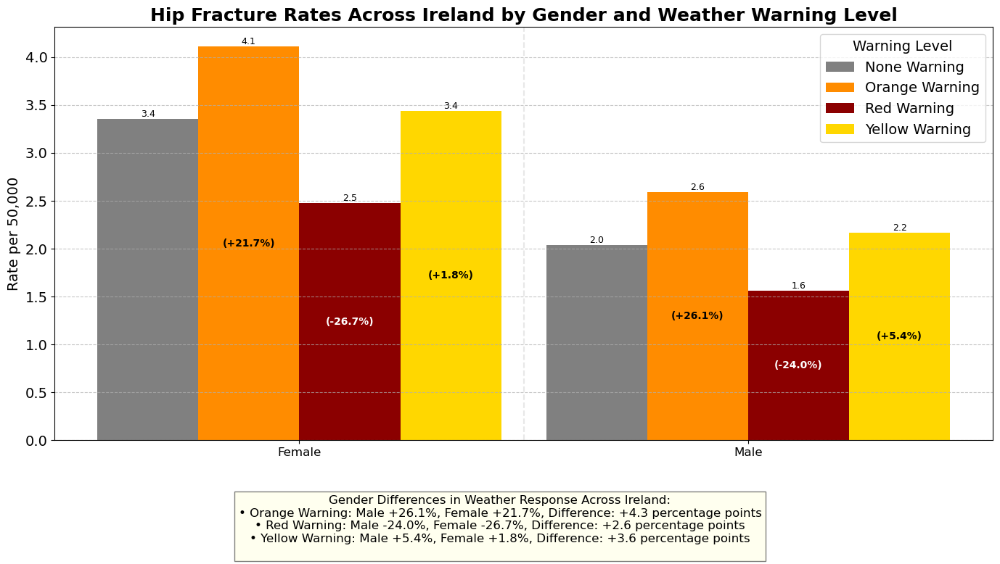

In [12]:
# First, calculate rates using your existing function
rates_df = calculate_hip_fracture_rates(poisson_results_2, df_final_expanded)

# Then calculate percentage changes using the new function
pct_changes = calculate_percentage_changes(rates_df)

# Create the nationwide plot with clear separation between gender groups
plot_nationwide_rates(rates_df, pct_changes, save_path="/home/paulharford/college/project/ul_project_Msc_AI/analysis/processed_data/visual_outputs/ihfd_weather/ireland_hip_fracture_summary.png")

In [13]:
def plot_yearly_hip_fractures_by_weather(df, save_path=None):
    """
    Create a stacked bar chart showing total hip fractures per year and 
    how many happened during adverse weather conditions.
    
    Parameters:
    -----------
    df : pandas DataFrame
        Dataset with daily observations including dates, weather events, and hip fracture counts
    save_path : str or None, optional (default=None)
        If provided, saves the plot to this file path
    
    Returns:
    --------
    pandas DataFrame
        Summary data of fractures by year and weather condition
    """
    import matplotlib.pyplot as plt
    import pandas as pd
    import numpy as np
    
    # Check if we have any data to plot
    if df.empty:
        print("No data available to plot.")
        return
    
    # Ensure we have the required columns
    required_cols = ['date', 'weather_event', 'hip_fracture_count']
    if not all(col in df.columns for col in required_cols):
        print(f"Error: Dataset must contain all of these columns: {required_cols}")
        return
    
    # Convert date column to datetime if it's not already
    if not pd.api.types.is_datetime64_any_dtype(df['date']):
        df['date'] = pd.to_datetime(df['date'])
    
    # Extract year from date
    df['year'] = df['date'].dt.year
    
    # Group by year and calculate the metrics
    yearly_data = []
    
    for year in sorted(df['year'].unique()):
        year_df = df[df['year'] == year]
        
        # Calculate total fractures for the year
        total_fractures = year_df['hip_fracture_count'].sum()
        
        # Calculate fractures during adverse weather
        adverse_weather_fractures = year_df[year_df['weather_event'] > 0]['hip_fracture_count'].sum()
        
        # Calculate fractures during normal weather
        normal_weather_fractures = total_fractures - adverse_weather_fractures
        
        yearly_data.append({
            'Year': year,
            'Total Fractures': total_fractures,
            'Fractures During Adverse Weather': adverse_weather_fractures,
            'Fractures During Non Adverse Weather': normal_weather_fractures,
            'Percentage During Adverse Weather': (adverse_weather_fractures / total_fractures * 100) if total_fractures > 0 else 0
        })
    
    # Convert to DataFrame
    yearly_df = pd.DataFrame(yearly_data)
    
    # Create figure with appropriate dimensions
    fig, ax = plt.subplots(figsize=(11.5, 5.5))
    
    # Set up the x-axis values - use actual positions (0, 1, 2, etc.)
    x_pos = np.arange(len(yearly_df))
    
    # Get the data
    years = yearly_df['Year'].astype(str)  # Convert years to strings for display
    adverse_fractures = yearly_df['Fractures During Adverse Weather']
    normal_fractures = yearly_df['Fractures During Non Adverse Weather']
    
    # Create the stacked bars
    p1 = ax.bar(x_pos, adverse_fractures, width=0.7, color='Red', label='During Adverse Weather')
    p2 = ax.bar(x_pos, normal_fractures, width=0.7, bottom=adverse_fractures, color='darkorange', label='During No Weather')
    
    # Add labels and title
    ax.set_xlabel('Year', fontsize=12)
    ax.set_ylabel('Number of Hip Fractures', fontsize=12)
    ax.set_title('Total Hip Fractures by Year and Weather Condition', fontsize=16)
    
    # Set x-ticks to be at the positions and label them with the years
    ax.set_xticks(x_pos)
    ax.set_xticklabels(years, rotation=0)  # No rotation for years
    
    # Add spacing to prevent crowding - adjust the x-axis limits
    plt.xlim(-0.5, len(yearly_df) - 0.5)
    
    # Add legend
    ax.legend(loc='upper left')
    
    # Add a grid for easier reading
    ax.grid(axis='y', linestyle='--', alpha=0.7)
    
    # Add annotations with appropriate spacing
    for i, year_data in enumerate(yearly_data):
        total = year_data['Total Fractures']
        adverse = year_data['Fractures During Adverse Weather']
        percentage = year_data['Percentage During Adverse Weather']
        
        # Add total number at the top of each bar with some padding
        ax.text(i, total + (max(yearly_df['Total Fractures']) * 0.02), 
                f'Total: {int(total)}', ha='center', va='bottom', fontsize=10)
        
        # Add percentage in the middle of the adverse weather portion
        # Only if the section is large enough to fit text
        if adverse > max(yearly_df['Total Fractures']) * 0.05:
            ax.text(i, adverse/2, f'{percentage:.1f}%', 
                    ha='center', va='center', color='black', fontweight='bold', fontsize=10)
    
    # Ensure there's enough room at the top for labels
    max_value = yearly_df['Total Fractures'].max()
    ax.set_ylim(0, max_value * 1.1)  # Add 10% padding at the top
    
    # Use tight layout to optimize use of space
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Yearly hip fractures plot saved to: {save_path}")
        
    plt.show()
    
    return yearly_df  # Return the aggregated data for further analysis

Yearly hip fractures plot saved to: /home/paulharford/college/project/ul_project_Msc_AI/analysis/processed_data/visual_outputs/ihfd_weather/yearly_hip_fractures.png


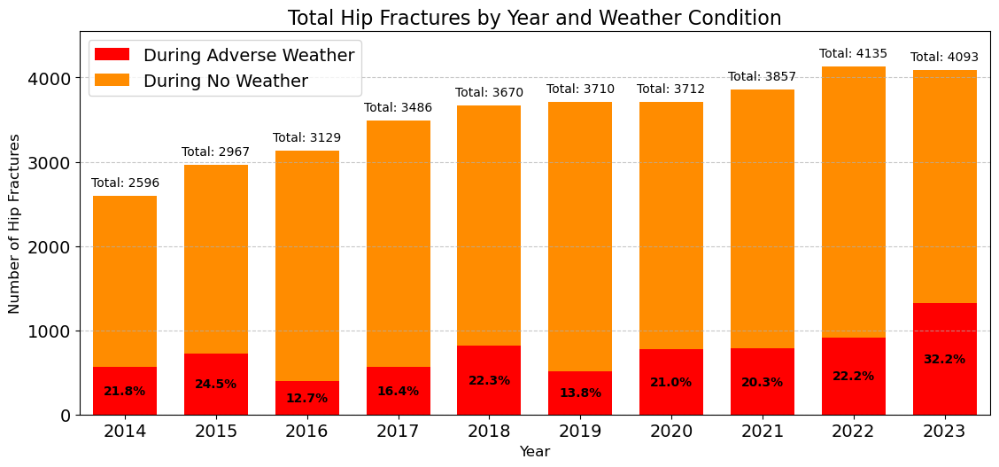

In [14]:
# Assuming 'df' contains your dataset with the required columns
yearly_summary = plot_yearly_hip_fractures_by_weather(df_final_expanded, save_path="/home/paulharford/college/project/ul_project_Msc_AI/analysis/processed_data/visual_outputs/ihfd_weather/yearly_hip_fractures.png")

In [15]:
def plot_hip_fractures_by_age_gender_weather(df, save_path=None):
    """
    Create a stacked bar chart showing the percentage distribution of hip fractures
    by age group, gender, and weather conditions across all years, using a 
    colorblind-friendly palette from ColorBrewer. Simplified labels for clarity.
    
    Parameters:
    -----------
    df : pandas DataFrame
        Dataset with hip fracture information including age_group, gender, weather_event, and hip_fracture_count
    save_path : str or None, optional (default=None)
        If provided, saves the plot to this file path
    
    Returns:
    --------
    pandas DataFrame
        Summary of hip fracture percentages by age group, gender, and weather condition
    """
    # Ensure we have the required columns
    required_cols = ['age_group', 'gender', 'hip_fracture_count', 'weather_event']
    if not all(col in df.columns for col in required_cols):
        print(f"Error: Dataset must contain all of these columns: {required_cols}")
        return
    
    # Process the age group labels - simplify "85 years and over" to "85+"
    df = df.copy()
    df['age_group'] = df['age_group'].replace('85 years and over', '85+')
    
    # Calculate total fractures by age group, gender, and weather
    age_gender_weather_counts = df.groupby(['age_group', 'gender', 'weather_event'])['hip_fracture_count'].sum().reset_index()
    
    # Calculate total fractures overall
    total_fractures = age_gender_weather_counts['hip_fracture_count'].sum()
    
    # Calculate percentages of total fractures
    age_gender_weather_counts['percentage'] = (age_gender_weather_counts['hip_fracture_count'] / total_fractures) * 100
    
    # Order age groups appropriately (assuming they follow a standard format)
    # Extract age groups and determine proper order
    age_groups = sorted(age_gender_weather_counts['age_group'].unique(), 
                         key=lambda x: int(x.split('-')[0]) if '-' in x else 
                                      (int(x.split('+')[0]) if '+' in x else 
                                       (int(x.split(' ')[0]) if x[0].isdigit() else 100)))
    
    # Set up ColorBrewer color scheme (Yellow-Orange-Red) for colorblind accessibility
    # These colors are from the YlOrRd palette in ColorBrewer which is colorblind-friendly
    color_mapping = {
        ('Female', 0.0): '#FED976',  # Light yellow for females in normal weather
        ('Female', 1.0): '#E31A1C',  # Dark red for females in adverse weather
        ('Male', 0.0): '#FEB24C',    # Light orange for males in normal weather
        ('Male', 1.0): '#BD0026'     # Darker red for males in adverse weather
    }
    
    # Create figure with more space for layout
    fig = plt.figure(figsize=(14, 14))  
    
    # Add the main chart in the top subplot
    ax1 = plt.subplot2grid((12, 1), (0, 0), rowspan=8)
    
    # Set up the grouped bar chart
    bar_width = 0.4
    index = np.arange(len(age_groups))
    
    # Process data for plotting
    # First, create a pivot table for easier access
    pivot_data = age_gender_weather_counts.pivot_table(
        index=['age_group', 'gender'], 
        columns=['weather_event'], 
        values=['hip_fracture_count', 'percentage']
    ).fillna(0)
    
    # Create empty lists to store plot data
    female_normal_pcts = []
    female_adverse_pcts = []
    male_normal_pcts = []
    male_adverse_pcts = []
    
    # Populate data for each age group
    for age in age_groups:
        # Female data
        try:
            f_normal = pivot_data.loc[(age, 'Female'), ('percentage', 0.0)]
            female_normal_pcts.append(f_normal)
        except KeyError:
            female_normal_pcts.append(0)
            
        try:
            f_adverse = pivot_data.loc[(age, 'Female'), ('percentage', 1.0)]
            female_adverse_pcts.append(f_adverse)
        except KeyError:
            female_adverse_pcts.append(0)
            
        # Male data
        try:
            m_normal = pivot_data.loc[(age, 'Male'), ('percentage', 0.0)]
            male_normal_pcts.append(m_normal)
        except KeyError:
            male_normal_pcts.append(0)
            
        try:
            m_adverse = pivot_data.loc[(age, 'Male'), ('percentage', 1.0)]
            male_adverse_pcts.append(m_adverse)
        except KeyError:
            male_adverse_pcts.append(0)
    
    # Plot the stacked bars
    # Female bars
    female_normal_bars = ax1.bar(index - bar_width/2, female_normal_pcts, bar_width, 
            color=color_mapping[('Female', 0.0)], edgecolor='black', linewidth=0.5)
    female_adverse_bars = ax1.bar(index - bar_width/2, female_adverse_pcts, bar_width, 
            bottom=female_normal_pcts, color=color_mapping[('Female', 1.0)], 
            edgecolor='black', linewidth=0.5)
    
    # Male bars
    male_normal_bars = ax1.bar(index + bar_width/2, male_normal_pcts, bar_width, 
            color=color_mapping[('Male', 0.0)], edgecolor='black', linewidth=0.5)
    male_adverse_bars = ax1.bar(index + bar_width/2, male_adverse_pcts, bar_width, 
            bottom=male_normal_pcts, color=color_mapping[('Male', 1.0)], 
            edgecolor='black', linewidth=0.5)
    
    # Add labels, title, and legend
    ax1.set_xlabel('Age Group', fontsize=14)
    ax1.set_ylabel('Percentage of Total Hip Fractures (%)', fontsize=14)
    ax1.set_title('Distribution of Hip Fractures by Age Group, Gender, and Weather Condition (2014-2023)', fontsize=16)
    ax1.set_xticks(index)
    ax1.set_xticklabels(age_groups, rotation=45, ha='right', fontsize=12)
    ax1.tick_params(axis='x', pad=10)  # Add padding below x-axis labels
    
    # Custom legend with more detailed information
    legend_elements = [
        Patch(facecolor=color_mapping[('Female', 0.0)], edgecolor='black', label='Female - Normal Weather'),
        Patch(facecolor=color_mapping[('Female', 1.0)], edgecolor='black', label='Female - Adverse Weather'),
        Patch(facecolor=color_mapping[('Male', 0.0)], edgecolor='black', label='Male - Normal Weather'),
        Patch(facecolor=color_mapping[('Male', 1.0)], edgecolor='black', label='Male - Adverse Weather')
    ]
    ax1.legend(handles=legend_elements, loc='upper left', fontsize=12)
    
    # Add grid for better readability
    ax1.grid(axis='y', linestyle='--', alpha=0.7)
    
    # Add percentage labels on top of each bar
    for i in range(len(age_groups)):
        # Calculate total percentages for each gender
        female_total = female_normal_pcts[i] + female_adverse_pcts[i]
        male_total = male_normal_pcts[i] + male_adverse_pcts[i]
        
        # Add total percentage labels if bars are high enough
        if female_total > 0.5:
            ax1.text(i - bar_width/2, female_total + 0.3, f'{female_total:.1f}%', 
                    ha='center', va='bottom', fontsize=10)
        
        if male_total > 0.5:
            ax1.text(i + bar_width/2, male_total + 0.3, f'{male_total:.1f}%', 
                    ha='center', va='bottom', fontsize=10)
        
        # Add percentage breakdown for adverse weather if high enough
        if female_adverse_pcts[i] > 0.5:
            ax1.text(i - bar_width/2, female_normal_pcts[i] + female_adverse_pcts[i]/2, 
                    f'{female_adverse_pcts[i]/female_total*100:.0f}%', 
                    ha='center', va='center', color='white', fontsize=9, fontweight='bold')
            
        if male_adverse_pcts[i] > 0.5:
            ax1.text(i + bar_width/2, male_normal_pcts[i] + male_adverse_pcts[i]/2, 
                    f'{male_adverse_pcts[i]/male_total*100:.0f}%', 
                    ha='center', va='center', color='white', fontsize=9, fontweight='bold')
    
    # Calculate totals by weather and gender for annotations
    weather_gender_totals = age_gender_weather_counts.groupby(['gender', 'weather_event'])['hip_fracture_count'].sum()
    
    female_normal = weather_gender_totals.get(('Female', 0.0), 0)
    female_adverse = weather_gender_totals.get(('Female', 1.0), 0)
    male_normal = weather_gender_totals.get(('Male', 0.0), 0)
    male_adverse = weather_gender_totals.get(('Male', 1.0), 0)
    
    female_total = female_normal + female_adverse
    male_total = male_normal + male_adverse
    total_fractures = female_total + male_total
    
    # Create a second subplot with more separation
    ax2 = plt.subplot2grid((12, 1), (9, 0), rowspan=3)  # Note the gap at position 8
    ax2.axis('off')  # Hide axes
    
    # Add statistical information as text
    statistical_info = (
        "Statistical Summary:\n\n"
        f"Total Hip Fractures (2014-2023): {int(total_fractures):,}\n\n"
        f"Female Fractures: {int(female_total):,} ({female_total/total_fractures*100:.1f}% of total)\n"
        f"  • Normal Weather: {int(female_normal):,} ({female_normal/female_total*100:.1f}% of female fractures)\n"
        f"  • Adverse Weather: {int(female_adverse):,} ({female_adverse/female_total*100:.1f}% of female fractures)\n\n"
        f"Male Fractures: {int(male_total):,} ({male_total/total_fractures*100:.1f}% of total)\n"
        f"  • Normal Weather: {int(male_normal):,} ({male_normal/male_total*100:.1f}% of male fractures)\n"
        f"  • Adverse Weather: {int(male_adverse):,} ({male_adverse/male_total*100:.1f}% of male fractures)"
    )
    
    # Add text to the second subplot, centered
    ax2.text(0.5, 0.5, statistical_info, fontsize=12, va='center', ha='center', 
            transform=ax2.transAxes, bbox=dict(boxstyle='round', facecolor='#EEEEEE', alpha=0.8))
    
    # Adjust layout with more space
    plt.tight_layout(h_pad=3.0)
    plt.subplots_adjust(hspace=0.4)
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Hip fracture demographics plot saved to: {save_path}")
    
    plt.show()
    
    # Create a summary DataFrame for return
    # Reshape the data for better presentation
    summary = age_gender_weather_counts.pivot_table(
        index='age_group', 
        columns=['gender', 'weather_event'], 
        values=['hip_fracture_count', 'percentage']
    ).reset_index()
    
    # Calculate weather proportions within each age-gender group
    proportions = pd.DataFrame()
    proportions['age_group'] = age_groups
    
    for gender in ['Female', 'Male']:
        for weather in [0.0, 1.0]:
            weather_label = 'Normal' if weather == 0.0 else 'Adverse'
            col_name = f'{gender}_{weather_label}_Weather_pct'
            
            # Calculate the proportion for each age group
            proportions[col_name] = [
                age_gender_weather_counts[
                    (age_gender_weather_counts['age_group'] == age) & 
                    (age_gender_weather_counts['gender'] == gender) & 
                    (age_gender_weather_counts['weather_event'] == weather)
                ]['hip_fracture_count'].sum() /
                age_gender_weather_counts[
                    (age_gender_weather_counts['age_group'] == age) & 
                    (age_gender_weather_counts['gender'] == gender)
                ]['hip_fracture_count'].sum() * 100
                if age_gender_weather_counts[
                    (age_gender_weather_counts['age_group'] == age) & 
                    (age_gender_weather_counts['gender'] == gender)
                ]['hip_fracture_count'].sum() > 0 else 0
                for age in age_groups
            ]
    
    print("Weather Distribution within Age and Gender Groups:")
    print(proportions)
    
    # Return the summary data with both absolute counts and percentages
    return proportions


/tmp/ipykernel_695441/312477096.py:200: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  plt.tight_layout(h_pad=3.0)


Hip fracture demographics plot saved to: /home/paulharford/college/project/ul_project_Msc_AI/analysis/processed_data/visual_outputs/ihfd_weather/hip_fracture_demographics_weather.png


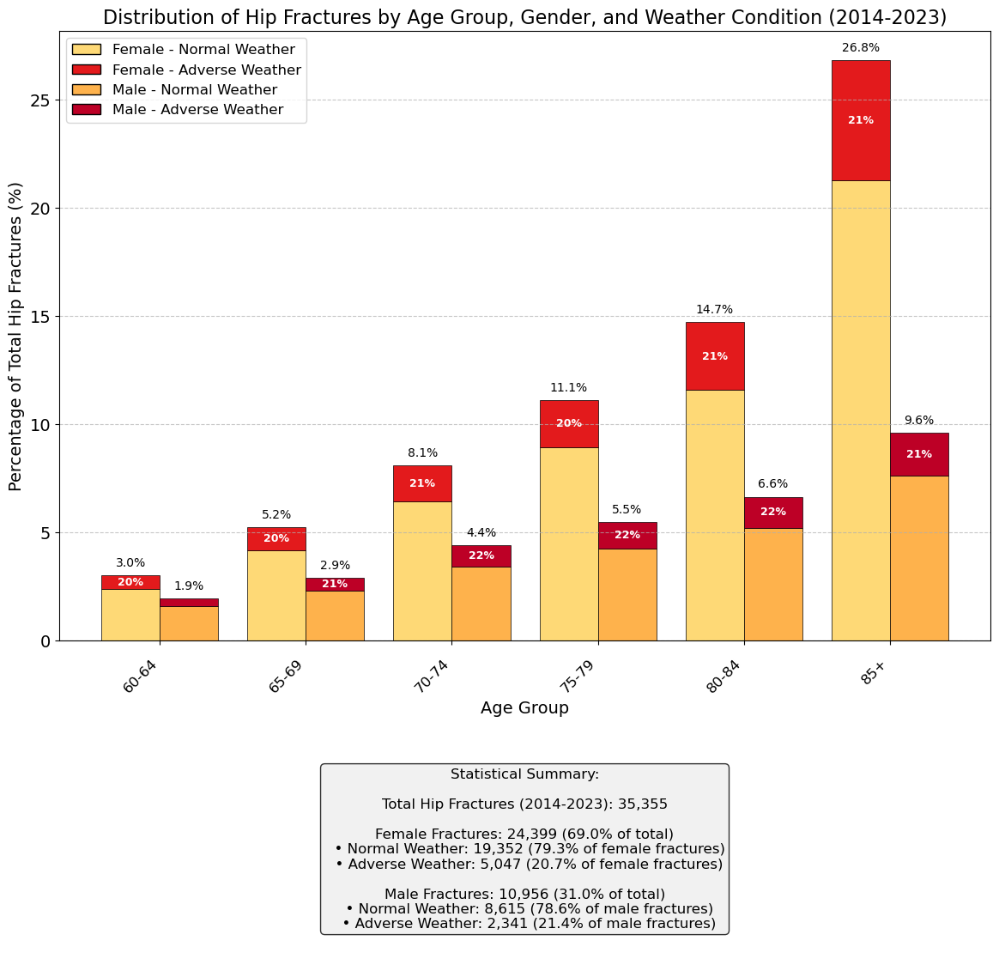

Weather Distribution within Age and Gender Groups:
  age_group  Female_Normal_Weather_pct  Female_Adverse_Weather_pct  \
0     60-64                  79.755179                   20.244821   
1     65-69                  79.859231                   20.140769   
2     70-74                  79.182676                   20.817324   
3     75-79                  80.162767                   19.837233   
4     80-84                  78.685374                   21.314626   
5       85+                  79.193005                   20.806995   

   Male_Normal_Weather_pct  Male_Adverse_Weather_pct  
0                80.523256                 19.476744  
1                78.675755                 21.324245  
2                77.535302                 22.464698  
3                77.777778                 22.222222  
4                78.416347                 21.583653  
5                79.376287                 20.623713  


,age_group,Female_Normal_Weather_pct,Female_Adverse_Weather_pct,Male_Normal_Weather_pct,Male_Adverse_Weather_pct
0,60-64,79.755179,20.244821,80.523256,19.476744
1,65-69,79.859231,20.140769,78.675755,21.324245
2,70-74,79.182676,20.817324,77.535302,22.464698
3,75-79,80.162767,19.837233,77.777778,22.222222
4,80-84,78.685374,21.314626,78.416347,21.583653
5,85+,79.193005,20.806995,79.376287,20.623713


In [16]:
plot_hip_fractures_by_age_gender_weather(df_final_expanded, save_path="/home/paulharford/college/project/ul_project_Msc_AI/analysis/processed_data/visual_outputs/ihfd_weather/hip_fracture_demographics_weather.png")


Correlations with hip_fracture_count:
hip_fracture_count          1.000000
female                      0.344067
male                        0.241170
orange_warning              0.020927
warning_severity_numeric    0.014164
weather_event               0.013177
yellow_warning              0.006588
red_warning                -0.013222
Name: hip_fracture_count, dtype: float64


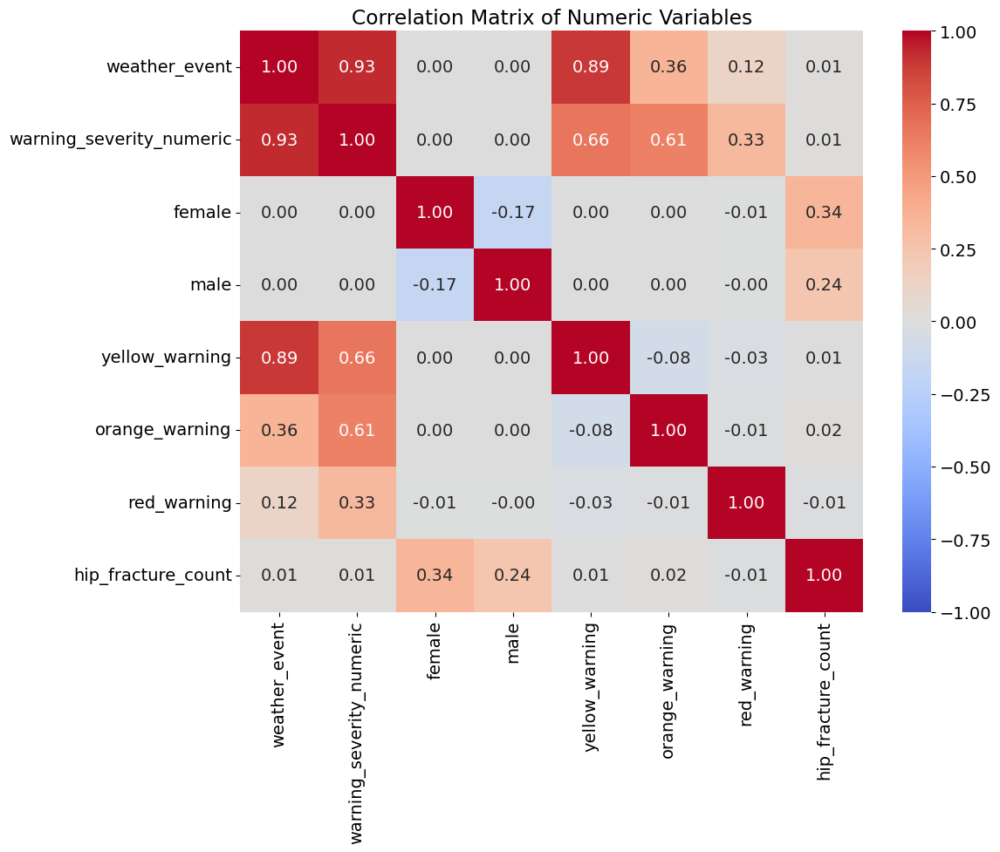

In [17]:
import matplotlib.pyplot as plt 
#hip_fracture_count          1.000000
#LOS                         0.526502
#total                       0.449492
#female                      0.326420
#male                        0.257891
#counties_in_region          0.179600
#is_winter                   0.039470
#cold_weather                0.031975
#cold_lag                    0.031811
#orange_warning              0.020326
#orange_warning_lag          0.018111
#warning_severity_numeric    0.013951
#weather_event               0.013177

numeric_cols = ['weather_event', 'warning_severity_numeric', 'female', 'male', 'yellow_warning','orange_warning','red_warning','hip_fracture_count']
save_path="/home/paulharford/college/project/ul_project_Msc_AI/analysis/processed_data/visual_outputs/ihfd_weather/heatmap.png"
# Make sure 'hip_fracture_count' is included
if 'hip_fracture_count' not in numeric_cols:
    print("Warning: hip_fracture_count not found in numeric columns")
else:
    # Create a correlation matrix
    corr_matrix = df_final_expanded[numeric_cols].corr(method='pearson')
    
    # Sort correlations with hip_fracture_count
    hip_correlations = corr_matrix['hip_fracture_count'].sort_values(ascending=False)
    print("Correlations with hip_fracture_count:")
    print(hip_correlations)
    
    # Plot heatmap of correlations
    plt.figure(figsize=(12, 10))
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1, fmt='.2f')
    plt.title('Correlation Matrix of Numeric Variables')
    plt.tight_layout()
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()
    

In [18]:
def calculate_percentage_changes(rates_df, reference_population=50000):
    """
    Calculate percentage changes from baseline for all combinations in the rates DataFrame.
    
    Parameters:
    -----------
    rates_df : pandas DataFrame
        Output from calculate_hip_fracture_rates function
    reference_population : int, optional (default=100000)
        Population size used for standardization
    
    Returns:
    --------
    dict
        Dictionary with (region, gender, warning) keys and percentage change values
    """
    pct_changes = {}
    rate_col = f'Rate per {reference_population:,}'
    
    # First, store all baseline rates
    baselines = {}
    for _, row in rates_df[rates_df['Warning Color'] == 'None'].iterrows():
        region = row['Region']
        gender = row['Gender']
        baselines[(region, gender)] = row[rate_col]
    
    # Then calculate percentage changes for all non-baseline scenarios
    for _, row in rates_df[rates_df['Warning Color'] != 'None'].iterrows():
        region = row['Region']
        gender = row['Gender']
        warning = row['Warning Color']
        current_rate = row[rate_col]
        
        # Get the corresponding baseline rate
        baseline_key = (region, gender)
        if baseline_key in baselines and baselines[baseline_key] > 0:
            baseline_rate = baselines[baseline_key]
            pct_change = ((current_rate - baseline_rate) / baseline_rate) * 100
            pct_changes[(region, gender, warning)] = pct_change
    
    return pct_changes

In [19]:
# Set the renderer to notebook for Jupyter
pio.renderers.default = "notebook"

def plot_hip_fracture_sunburst(rates_df, pct_changes, reference_population=50000, save_path=None):
    """
    Create a sunburst visualization showing hip fracture rates
    for all regions by gender during different weather warning levels.
    
    Parameters:
    -----------
    rates_df : pandas DataFrame
        DataFrame with columns 'Region', 'Gender', 'Warning Color', and rate column
    pct_changes : dict
        Dictionary with (region, gender, warning) keys and percentage change values
    reference_population : int, optional (default=50000)
        Population size used for standardization
    save_path : str or None, optional (default=None)
        If provided, saves the plot to this file path
    
    Returns:
    --------
    plotly figure
    """
    # Check if we have any data to plot
    if rates_df.empty:
        print("No data available to plot.")
        return None
    
    # Define colors for warning levels
    warning_colors = {
        'None': '#8B8B8B',   # Gray
        'Yellow': '#FFD700', # Gold
        'Orange': '#FF8C00', # Dark Orange
        'Red': '#B22222'     # Firebrick Red
    }
    
    # Gender colors
    gender_colors = {
        'Female': '#E377C2',  # Pink
        'Male': '#1F77B4'     # Blue
    }
    
    # Get unique regions and genders
    regions = sorted(rates_df['Region'].unique())
    genders = sorted(rates_df['Gender'].unique())
    
    # Rate column name
    rate_col = f'Rate per {reference_population:,}'
    
    # Prepare data for sunburst chart
    labels = []
    parents = []
    values = []  # We'll use this for the rates
    colors = []  # For custom coloring
    customdata = []  # For percentage changes
    
    # Add root
    labels.append("Hip Fractures")
    parents.append("")
    values.append(0)  # No value for the root
    colors.append("white")
    customdata.append([0, ""])  # [pct_change, hover_text]
    
    # Add regions
    for region in regions:
        region_data = rates_df[rates_df['Region'] == region]
        region_avg_rate = region_data[rate_col].mean() if not region_data.empty else 0
        
        labels.append(region)
        parents.append("Hip Fractures")
        values.append(region_avg_rate)
        colors.append("#AAAAAA")  # Neutral gray for regions
        customdata.append([0, f"Average rate: {region_avg_rate:.1f}"])
        
        # Add genders for each region
        for gender in genders:
            gender_data = region_data[region_data['Gender'] == gender]
            if not gender_data.empty:
                gender_avg_rate = gender_data[rate_col].mean()
                
                labels.append(f"{region} - {gender}")
                parents.append(region)
                values.append(gender_avg_rate)
                colors.append(gender_colors[gender])
                customdata.append([0, f"Average rate: {gender_avg_rate:.1f}"])
                
                # Add warning levels for each region and gender
                for warning in warning_colors.keys():
                    warning_data = gender_data[gender_data['Warning Color'] == warning]
                    
                    if not warning_data.empty:
                        avg_rate = warning_data[rate_col].mean()
                        # Get percentage change using the correct key structure
                        pct_change = pct_changes.get((region, gender, warning), 0)
                        
                        labels.append(f"{region} - {gender} - {warning}")
                        parents.append(f"{region} - {gender}")
                        values.append(avg_rate)
                        colors.append(warning_colors[warning])
                        customdata.append([pct_change, f"Rate: {avg_rate:.1f}<br>Change: {pct_change:+.1f}%"])
    
    # Create the sunburst figure
    fig = go.Figure(go.Sunburst(
        labels=labels,
        parents=parents,
        values=values,
        branchvalues="total",
        marker=dict(colors=colors),
        customdata=customdata,
        hovertemplate='<b>%{label}</b><br>%{customdata[1]}<extra></extra>',
        maxdepth=3  # Limit to region, gender, and warning level
    ))
    
    # Update layout
    fig.update_layout(
        title={
            'text': 'Hip Fracture Rates by Region, Gender, and Weather Warning Level',
            'font': {'size': 24, 'family': 'Arial, sans-serif', 'color': 'black'},
            'x': 0.5,
            'xanchor': 'center'
        },
        width=900,
        height=900,
        margin=dict(t=100, l=0, r=0, b=0)
    )
    
    # Save if requested
    if save_path:
        fig.write_image(save_path)
        print(f"Sunburst visualization saved to: {save_path}")
    
    return fig

def plot_hip_fracture_sunburst_simplified(rates_df, pct_changes, reference_population=50000, save_path=None):
    """
    Create a simplified sunburst visualization focusing only on regions and warning levels,
    averaging across genders to make the visualization less complex.
    
    Parameters:
    -----------
    rates_df : pandas DataFrame
        DataFrame with columns 'Region', 'Gender', 'Warning Color', and rate column
    pct_changes : dict
        Dictionary with (region, gender, warning) keys and percentage change values
    reference_population : int, optional (default=50000)
        Population size used for standardization
    save_path : str or None, optional (default=None)
        If provided, saves the plot to this file path
    
    Returns:
    --------
    plotly figure
    """
    # Check if we have any data to plot
    if rates_df.empty:
        print("No data available to plot.")
        return None
    
    # Define colors for warning levels
    warning_colors = {
        'None': '#8B8B8B',   # Gray
        'Yellow': '#FFD700', # Gold
        'Orange': '#FF8C00', # Dark Orange
        'Red': '#B22222'     # Firebrick Red
    }
    
    # Get unique regions
    regions = sorted(rates_df['Region'].unique())
    
    # Rate column name
    rate_col = f'Rate per {reference_population:,}'
    
    # Prepare data for sunburst chart
    labels = []
    parents = []
    values = []  # We'll use this for the rates
    colors = []  # For custom coloring
    customdata = []  # For percentage changes
    
    # Add root
    labels.append("Hip Fractures")
    parents.append("")
    values.append(0)  # No value for the root
    colors.append("white")
    customdata.append([0, ""])  # [pct_change, hover_text]
    
    # Create a new DataFrame that averages rates across genders
    # Group by Region and Warning Color, and calculate mean rates
    avg_rates = rates_df.groupby(['Region', 'Warning Color'])[rate_col].mean().reset_index()
    
    # Calculate average percentage changes
    avg_pct_changes = {}
    for region in regions:
        for warning in warning_colors.keys():
            # Find all keys for this region and warning, regardless of gender
            relevant_keys = [k for k in pct_changes.keys() 
                            if k[0] == region and k[2] == warning]
            if relevant_keys:
                # Calculate average percentage change
                avg_pct = sum(pct_changes[k] for k in relevant_keys) / len(relevant_keys)
                avg_pct_changes[(region, warning)] = avg_pct
    
    # Add regions
    for region in regions:
        region_data = avg_rates[avg_rates['Region'] == region]
        region_avg_rate = region_data[rate_col].mean() if not region_data.empty else 0
        
        labels.append(region)
        parents.append("Hip Fractures")
        values.append(region_avg_rate)
        colors.append("#AAAAAA")  # Neutral gray for regions
        customdata.append([0, f"Average rate: {region_avg_rate:.1f}"])
        
        # Add warning levels for each region (averaged across genders)
        for warning in warning_colors.keys():
            warning_data = region_data[region_data['Warning Color'] == warning]
            
            if not warning_data.empty:
                avg_rate = warning_data[rate_col].values[0]
                # Get percentage change using the simplified key structure
                pct_change = avg_pct_changes.get((region, warning), 0)
                
                labels.append(f"{region} - {warning}")
                parents.append(region)
                values.append(avg_rate)
                colors.append(warning_colors[warning])
                customdata.append([pct_change, f"Rate: {avg_rate:.1f}<br>Change: {pct_change:+.1f}%"])
    
    # Create the sunburst figure
    fig = go.Figure(go.Sunburst(
        labels=labels,
        parents=parents,
        values=values,
        branchvalues="total",
        marker=dict(colors=colors),
        customdata=customdata,
        hovertemplate='<b>%{label}</b><br>%{customdata[1]}<extra></extra>',
        maxdepth=2  # Limit to region and warning level
    ))
    
    # Update layout
    fig.update_layout(
        title={
            'text': 'Hip Fracture Rates by Region and Weather Warning Level (Averaged across Genders)',
            'font': {'size': 24, 'family': 'Arial, sans-serif', 'color': 'black'},
            'x': 0.5,
            'xanchor': 'center'
        },
        width=900,
        height=900,
        margin=dict(t=100, l=0, r=0, b=0)
    )
    
    # Add a legend for warning colors
    for i, (warning, color) in enumerate(warning_colors.items()):
        fig.add_annotation(
            x=0.95,
            y=0.9 - (i * 0.05),
            xref="paper",
            yref="paper",
            text=f"{warning} Warning",
            showarrow=False,
            font=dict(color="black", size=12),
            bgcolor=color,
            bordercolor="black",
            borderwidth=1,
            borderpad=4,
            opacity=0.8
        )
    
    # Save if requested
    if save_path:
        fig.write_image(save_path)
        print(f"Simplified sunburst visualization saved to: {save_path}")
    
    return fig

In [20]:
# Add these diagnostic checks before creating the plots
print("Rates dataframe shape:", rates_df.shape)
print("Rates dataframe columns:", rates_df.columns.tolist())
print("Sample of rates dataframe:\n", rates_df.head())
print("Warning colors present:", rates_df['Warning Color'].unique())
print("Number of regions:", rates_df['Region'].nunique())
print("Sample of pct_changes:", list(pct_changes.items())[:5])

Rates dataframe shape: (48, 5)
Rates dataframe columns: ['Region', 'Gender', 'Warning Color', 'Scenario', 'Rate per 50,000']
Sample of rates dataframe:
                     Region  Gender Warning Color        Scenario  \
0  HSE Dublin and Midlands  Female          None        Baseline   
2  HSE Dublin and Midlands  Female        Orange  Orange Warning   
3  HSE Dublin and Midlands  Female           Red     Red Warning   
1  HSE Dublin and Midlands  Female        Yellow  Yellow Warning   
4  HSE Dublin and Midlands    Male          None        Baseline   

   Rate per 50,000  
0         2.156995  
2         2.603044  
3         1.568496  
1         2.176698  
4         1.311340  
Warning colors present: ['None' 'Orange' 'Red' 'Yellow']
Number of regions: 6
Sample of pct_changes: [(('HSE Dublin and Midlands', 'Female', 'Orange'), 20.67922521406844), (('HSE Dublin and Midlands', 'Female', 'Red'), -27.283276629715118), (('HSE Dublin and Midlands', 'Female', 'Yellow'), 0.9134585260183006), 

In [21]:
def calculate_warning_distribution(df):
    """
    Calculate the distribution of weather warnings by region and severity.
    
    Parameters:
    -----------
    df : pandas DataFrame
        Dataset containing weather events and warnings
        
    Returns:
    --------
    pandas DataFrame
        Distribution of warnings by region and color
    """
    # First create a mapping between warning_severity_numeric and colors
    severity_to_color = {
        0: "None",
        1: "Yellow",
        2: "Orange", 
        3: "Red"
    }
    
    # Add warning color column if it doesn't exist
    if 'warning_color' not in df.columns:
        df['warning_color'] = df['warning_severity_numeric'].map(severity_to_color)
    
    # Filter for days with weather events
    weather_events = df[df['weather_event'] == 1].copy()
    
    # Count warnings by region and color
    warning_counts = weather_events.groupby(['region', 'warning_color']).size().reset_index(name='count')
    
    # Calculate percentages within each region
    region_totals = warning_counts.groupby('region')['count'].sum().reset_index(name='total')
    warning_counts = warning_counts.merge(region_totals, on='region')
    warning_counts['percentage'] = (warning_counts['count'] / warning_counts['total'] * 100).round(1)
    
    # Add average severity per region
    avg_severity = weather_events.groupby('region')['warning_severity_numeric'].mean().reset_index()
    avg_severity = avg_severity.rename(columns={'warning_severity_numeric': 'avg_severity'})
    
    # Merge with region totals
    region_summary = region_totals.merge(avg_severity, on='region')
    
    return warning_counts, region_summary

In [22]:
calculate_warning_distribution(df_final_expanded)

(                       region warning_color  count  total  percentage
 0     HSE Dublin and Midlands        Orange    467   3104        15.0
 1     HSE Dublin and Midlands           Red     16   3104         0.5
 2     HSE Dublin and Midlands        Yellow   2621   3104        84.4
 3   HSE Dublin and North East        Orange    348   2253        15.4
 4   HSE Dublin and North East           Red     34   2253         1.5
 5   HSE Dublin and North East        Yellow   1871   2253        83.0
 6   HSE Dublin and South East        Orange    339   2532        13.4
 7   HSE Dublin and South East           Red     29   2532         1.1
 8   HSE Dublin and South East        Yellow   2164   2532        85.5
 9                HSE Mid West        Orange    706   4611        15.3
 10               HSE Mid West           Red    128   4611         2.8
 11               HSE Mid West        Yellow   3777   4611        81.9
 12             HSE South West        Orange    586   3553        16.5
 13   

In [23]:
warning_counts, region_summary = calculate_warning_distribution(df_final_expanded)
rates_df = calculate_hip_fracture_rates(poisson_results_2, df_final_expanded)
pct_changes = calculate_percentage_changes(rates_df)

In [28]:
##############################################
# SECTION 1: COLOR DEFINITIONS FOR CIRCLES
##############################################
# --- Define color mappings for the warning level circles (now middle layer) ---
#warning_colors = {
#    'None': '#7986CB',    # Gray
#    'Yellow': '#FFD700',  # Gold
#    'Orange': '#FF8C00',  # Dark Orange
#    'Red': '#B22222'      # Firebrick Red
#}
# --- Define colors for the gender nodes (now outer layer) ---
#gender_color_map = {
#    'Male': '#29B6F6',    # Light blue
#    'Female': '#EC407A'   # Pink
#}
# --- Define colors for the region circles ---
# These are more saturated colors that will stand out better
#region_colors = [
#    '#42A5F5',  # Brighter blue
#    '#5C6BC0',  # Indigo
#    '#7E57C2',  # Purple
#    '#5E35B1',  # Deep purple
#    '#3949AB'   # Dark blue
#]

# Okabe–Ito subset for warnings:
warning_colors = {
    'None': '#bdbdbd',    # Medium gray (from Greys)
    'Yellow': '#ffffb2',  # Light yellow (YlOrRd)
    'Orange': '#feb24c',  # Mid orange (YlOrRd)
    'Red': '#f03b20'      # Deep red (YlOrRd)
}

# Okabe–Ito subset for gender:
gender_color_map = {
    'Male': '#66c2a5',    # Teal-ish from Set2
    'Female': '#fc8d62'   # Salmon from Set2
}

# For region colors, you can also pick from Okabe–Ito or other color-blind safe sets:
region_colors = [
    '#1b9e77',  # Teal
    '#d95f02',  # Dark orange
    '#7570b3',  # Muted purple
    '#e7298a',  # Magenta/pink
    '#66a61e',  # Green
    '#e6ab02'   # Mustard
]
# Color for the center/root circle - transparent
center_color = "#8da0cb"  # A soft purple-blue from Set2
##############################################
# SECTION 2: DATA STRUCTURE SETUP
##############################################
# These lists will hold all data for the sunburst chart
ids = []       # Unique ID for each node/circle
labels = []    # Text that appears on each circle
parents = []   # Parent circle ID (determines hierarchy)
values = []    # Numeric value for sizing circles
colors = []    # Fill color for each circle
customdata = []  # Extra data shown on hover
##############################################
# SECTION 3: ROOT NODE (CENTER CIRCLE)
##############################################
# Create the center circle of the sunburst chart
root_id = "WEATHERED"
ids.append(root_id)
labels.append(root_id)  # This text appears in the center
parents.append("")  # No parent for the root node
root_value = rates_df['Rate per 50,000'].sum()  # Keep original size
values.append(root_value)
colors.append(center_color)  # Using the transparent center color
customdata.append("")
##############################################
# SECTION 4: REGION NODES (FIRST CIRCLE LAYER)
##############################################
# Create the first layer of circles (Regions)
region_index = 0  # This counter helps us assign different colors to each region
for region in sorted(rates_df['Region'].unique()):
    # --- Process region names to remove HSE and add line breaks ---
    clean_region = region.replace("HSE ", "").replace("HSE", "").strip()
    
    # Add line breaks for region labels to make them appear level
    if len(clean_region) > 12:
        words = clean_region.split()
        wrapped_region = ""
        line_length = 0
        
        for word in words:
            if line_length + len(word) > 12:
                wrapped_region += "<br>" + word  # <br> creates a line break in the label
                line_length = len(word)
            else:
                if wrapped_region:
                    wrapped_region += " " + word
                else:
                    wrapped_region = word
                line_length += len(word) + 1
        
        display_region = wrapped_region
    else:
        display_region = clean_region
    
    # --- Add this region to our data structure ---
    region_id = f"Region: {region}"
    
    # Add black bold text for region labels using HTML styling
    region_display = f"<span style='color: black; font-weight: bold;'>{display_region}</span>"
    
    ids.append(region_id)
    labels.append(region_display)  # White text on region circles
    parents.append(root_id)  # Connect to the center circle
    region_value = rates_df.loc[rates_df['Region'] == region, 'Rate per 50,000'].sum()
    values.append(region_value)  # Size of this region's circle
    
    # Select one color from our region_colors array based on the current index
    region_color = region_colors[region_index % len(region_colors)]
    colors.append(region_color)  # Add just this one color to the colors array
    
    customdata.append(f"Region: {clean_region}")  # Hover text for this region
    region_index += 1  # Increase the index for the next region
    
    ##############################################
    # SECTION 5: WARNING NODES (NOW MIDDLE CIRCLE LAYER)
    ##############################################
    
    # Create the middle layer of circles (Warning levels under each region)
    for warning in sorted(rates_df[(rates_df['Region'] == region)]['Warning Color'].unique()):
        warning_id = f"{region_id} - {warning}"
        
        # Initialize warning display as empty
        warning_display = ""
        
        # Only find and display percentages for Red, Orange, and Yellow warnings
        if warning in ["Red", "Orange", "Yellow"]:
            # Find the percentage of this warning type in this region
            warning_pct = 0
            warning_row = warning_counts[(warning_counts['region'] == region) & 
                                      (warning_counts['warning_color'] == warning)]
            if not warning_row.empty:
                warning_pct = warning_row['percentage'].iloc[0]
            
            # Adjust text color based on warning color for better contrast
            text_color = "black"  # Default text color
            if warning in ['Red', 'Orange']:  # Darker backgrounds
                text_color = "white"  # Use white text for better visibility
                
            # Create the warning label with just the percentage
            warning_display = f"<span style='color: black; font-weight: bold;'>{warning_pct:.1f}%</span>"
        
        ids.append(warning_id)
        labels.append(warning_display)  # Empty for "None", percentage for others
        parents.append(region_id)  # Connect to the parent region circle
        
        # Calculate the sum of rates for this region and warning level - keep the original sizing
        warning_value = rates_df.loc[(rates_df['Region'] == region) & 
                                   (rates_df['Warning Color'] == warning), 'Rate per 50,000'].sum()
        values.append(warning_value)  # Keep original sizing based on rates
        
        # Use the appropriate warning color
        colors.append(warning_colors.get(warning, "gray"))
        
        # Include frequency percentage in customdata only for colored warnings
        if warning in ["Red", "Orange", "Yellow"]:
            customdata.append(f"Region: {clean_region}<br>Warning: {warning}<br>Frequency: {warning_pct:.1f}%")
        else:
            customdata.append(f"Region: {clean_region}<br>Warning: {warning}")
            
    
        
        ##############################################
        # SECTION 6: GENDER NODES (NOW OUTER CIRCLE LAYER)
        ##############################################
        
        # Create the outer layer of circles (Gender segments under each warning level)
        for gender in sorted(rates_df[(rates_df['Region'] == region) & 
                                     (rates_df['Warning Color'] == warning)]['Gender'].unique()):
            # Only proceed if there's data for this combination
            sub_df = rates_df[(rates_df['Region'] == region) & 
                             (rates_df['Warning Color'] == warning) & 
                             (rates_df['Gender'] == gender)]
            
            if not sub_df.empty:
                gender_id = f"{warning_id} - {gender}"
                
                # Get the rate value
                rate = sub_df['Rate per 50,000'].iloc[0]
                pct = pct_changes.get((region, gender, warning), 0)
                
                # Format the gender display with only rate information (no gender label)
                if pct != 0:
                    gender_label = f"{rate:.1f}<br>{pct:+.1f}%"
                else:
                    gender_label = f"{rate:.1f}"
                
                # Add white bold text for gender labels
                gender_display = f"<span style='color: black; font-weight: bold;'>{gender_label}</span>"
                
                ids.append(gender_id)
                labels.append(gender_display)
                parents.append(warning_id)  # Connect to the warning level circle
                values.append(rate)
                colors.append(gender_color_map.get(gender, "gray"))
                
                # Detailed hover information
                customdata.append(f"Region: {clean_region}<br>Warning: {warning}<br>Gender: {gender}<br>Rate: {rate:.1f}<br>Change: {pct:+.1f}%")
##############################################
# SECTION 7: CREATING THE SUNBURST CHART
##############################################
# Create the sunburst chart with all our data
fig = go.Figure(go.Sunburst(
    ids=ids,
    labels=labels,
    parents=parents,
    values=values,
    marker=dict(
        colors=colors,
        line=dict(color='black', width=2)  # THIS ADDS BLACK BORDERS to all circles (width 1.5 pixels)
    ),
    branchvalues='total',  # Makes parent values equal the sum of children
    hovertemplate='<b>%{customdata}</b><br>Value: %{value}<extra></extra>',  # Controls hover text format
    customdata=customdata,
    # Text orientation
    insidetextorientation='auto',
        
    # Set basic font properties
    textfont=dict(
        family="Arial, sans-serif",
        size=13,
        color="black"
    ),
    
    # Different text sizes for different levels
    insidetextfont=dict(  # For text inside circles
        family="Arial, sans-serif",
        size=[11, 12, 14],  # Original size for [leaf, branch, root]
        color="black"
    ),
    
    # Settings for text that doesn't fit inside slices
    outsidetextfont=dict(  # For text outside circles
        family="Arial, sans-serif", 
        size=12,
        color="black"
    ),
))
##############################################
# SECTION 8: ADDING WARNING COLOR LEGEND
##############################################
# Create a custom legend for warning colors and gender
legend_items = []
# Add colored rectangles with labels for each warning level
for warning, color in warning_colors.items():
    display_name = warning
    if warning == 'None':
        display_name = 'No Warning'
    else:
        display_name = f'{warning} Warning'
        # Create a colored rectangle with larger marker size
    legend_items.append(
        go.Scatter(
            x=[None],
            y=[None],
            mode='markers',
            marker=dict(size=20, color=color, symbol='square', line=dict(color='black', width=1)),
            name=display_name,
            showlegend=True,
            legendgroup='warnings'  # Group warning items together
        )
    )
# Add gender colors to the legend - separate from warning colors
for gender, color in gender_color_map.items():
    legend_items.append(
        go.Scatter(
            x=[None],
            y=[None],
            mode='markers',
            marker=dict(size=20, color=color, symbol='square', line=dict(color='black', width=1)),
            name=gender,
            showlegend=True,
            legendgroup='warnings'  # Use same group to avoid separate sections
        )
    )
# Add the legend items to the figure
for item in legend_items:
    fig.add_trace(item)
##############################################
# SECTION 9: CHART LAYOUT AND APPEARANCE
##############################################
# Set the overall chart size and title
fig.update_layout(
    title={
        'text': " ",
        'font': dict(
            family="Arial, sans-serif",
            size=24,
            color="black"
        ),
        'x': 0.5,
        'y': 1
    },
    margin=dict(t=50, l=25, r=25, b=25),  # Original margins
    width=1000,   # Original width
    height=1000,  # Original height
    # Remove background grid and color
    paper_bgcolor='rgba(0,0,0,0)',     # Transparent paper background
    plot_bgcolor='rgba(0,0,0,0)',      # Transparent plot background
    # Remove axis numbers and labels
    xaxis=dict(
        showticklabels=False,  # Hide X-axis tick labels
        showgrid=False,        # Hide X-axis grid lines
        zeroline=False,        # Hide X-axis zero line
        showline=False,        # Hide X-axis line
        visible=False          # Hide X-axis completely
    ),
    yaxis=dict(
        showticklabels=False,  # Hide Y-axis tick labels
        showgrid=False,        # Hide Y-axis grid lines
        zeroline=False,        # Hide Y-axis zero line
        showline=False,        # Hide Y-axis line
        visible=False          # Hide Y-axis completely
    ),
    showlegend=True,                   # Ensure legend is shown
    legend=dict(
        title={
            "text": " ",
            "font": {"size": 16, "family": "Arial, sans-serif", "color": "black"}
        },
        orientation="h",     # Horizontal legend
        yanchor="bottom",    # Anchor point for y position
        y=-0.08,             # Position legend much further below the chart
        xanchor="center",    # Anchor point for x position
        x=0.5,               # Center the legend horizontally
        bgcolor='rgba(255,255,255,0.9)',  # More opaque white background
        bordercolor="Black",              # Add border around legend
        borderwidth=1,                    # Border width
        font=dict(
            family="Arial, sans-serif",
            size=14,                      # Larger font size for legend items
            color="black"
        ),
        itemsizing="constant",            # Make all legend items the same size
        tracegroupgap=0,                  # Remove the gap between legend groups
        # Make the legend more rectangular by controlling its width and number of entries per row
        traceorder="normal",
        entrywidth=120,                   # Control width of each legend entry
        entrywidthmode="pixels"           # Use pixel width for entries
    )
)
# Display the chart
save_path="/home/paulharford/college/project/ul_project_Msc_AI/analysis/processed_data/visual_outputs/ihfd_weather/WEATHERED_sunburst_region_rates_weathercolours.jpeg"
plt.savefig(save_path)
fig.show()

<Figure size 600x600 with 0 Axes>

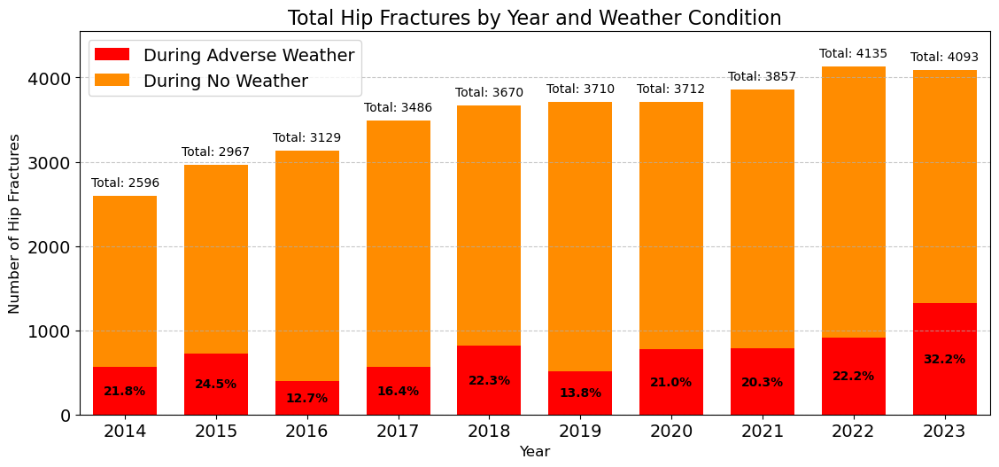

In [25]:
yearly_df = plot_yearly_hip_fractures_by_weather(df_final_expanded)
df_treemap = yearly_df.melt(
    id_vars=['Year'],
    value_vars=['Fractures During Adverse Weather', 'Fractures During Non Adverse Weather'],
    var_name='Weather Condition',
    value_name='Fracture Count'
)




In [26]:
import plotly.graph_objects as go
import pandas as pd

# Group by Region and Gender to calculate total rates
gender_totals = rates_df.groupby(['Region', 'Gender'])['Rate per 50,000'].sum().reset_index()

# Calculate percentages within each region
region_totals = gender_totals.groupby('Region')['Rate per 50,000'].sum().reset_index()
gender_totals = gender_totals.merge(region_totals, on='Region', suffixes=('', '_total'))
gender_totals['Percentage'] = (gender_totals['Rate per 50,000'] / gender_totals['Rate per 50,000_total'] * 100).round(1)

# Clean up region names - remove "HSE" and prepare for wrapping
gender_totals['Clean_Region'] = gender_totals['Region'].str.replace('HSE ', '')

# Create separate DataFrames for male and female
male_df = gender_totals[gender_totals['Gender'] == 'Male']
female_df = gender_totals[gender_totals['Gender'] == 'Female']

# Create the polar bar chart
fig = go.Figure()

# Add female trace
fig.add_trace(go.Barpolar(
    r=female_df['Rate per 50,000'],
    theta=female_df['Clean_Region'],
    name='Female',
    marker=dict(
        color='#f781bf',  # Pink
        line=dict(color='black', width=1.5)
    ),
    opacity=0.85,
    width=0.8,  # Wider bars to use more of the circle
    hovertemplate='<b>%{theta}</b><br>Female: %{r:.1f} per 50,000<br>Percentage: %{customdata:.1f}%<extra></extra>',
    customdata=female_df['Percentage']
))

# Add male trace
fig.add_trace(go.Barpolar(
    r=male_df['Rate per 50,000'],
    theta=male_df['Clean_Region'],
    name='Male',
    marker=dict(
        color='#377eb8',  # Light blue
        line=dict(color='black', width=1.5)
    ),
    opacity=0.85,
    width=0.8,  # Wider bars to use more of the circle
    hovertemplate='<b>%{theta}</b><br>Male: %{r:.1f} per 50,000<br>Percentage: %{customdata:.1f}%<extra></extra>',
    customdata=male_df['Percentage']
))

# Calculate max value for radial axis range
max_rate = gender_totals['Rate per 50,000'].max() * 1.1  # Add 10% margin

# Update layout with larger dimensions
fig.update_layout(
    title={
        'text': 'Hip Fracture Rates by Region and Gender',
        'font': {'size': 22, 'family': 'Arial, sans-serif'},
        'y': 0.98
    },
    polar={
        'radialaxis': {
            'visible': True,
            'range': [0, max_rate],  # Dynamic range based on data
            'showticklabels': False,  # Hide the tick labels
            'ticks': '',  # Remove tick marks
            'showline': False,  # Hide radial axis line
            'gridcolor': 'lightgray'
        },
        'angularaxis': {
            'tickfont': {'size': 14, 'family': 'Arial, sans-serif'},
            'direction': 'clockwise',
            'rotation': 0  # Start at top
        },
        'bgcolor': 'white',
        'gridshape': 'circular'  # Make grid lines circular instead of polygon
    },
    showlegend=True,
    legend={
        'orientation': 'h',  # Horizontal legend
        'yanchor': 'bottom',
        'y': -0.05,  # Move to bottom
        'xanchor': 'center',
        'x': 0.5,    # Center horizontally
        'font': {'size': 14}
    },
    width=900,  # Larger width
    height=900,  # Square dimensions for better circle
    margin={'t': 100, 'b': 150, 'l': 100, 'r': 100},  # Adjusted margins
    paper_bgcolor='white'
)

# Add explanation annotation at the bottom
fig.add_annotation(
    x=0.5,
    y=-0.22,  # Move lower to make room for legend
    xref='paper',
    yref='paper',
    text=' ',
    showarrow=False,
    font=dict(size=14, color='black', family='Arial, sans-serif'),
    align='center'
)

# Show the chart
fig.show()